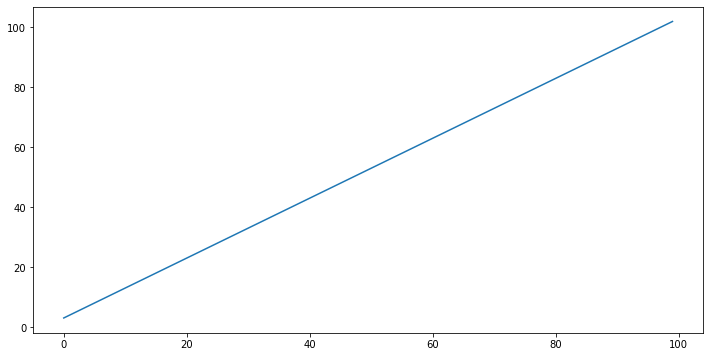

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

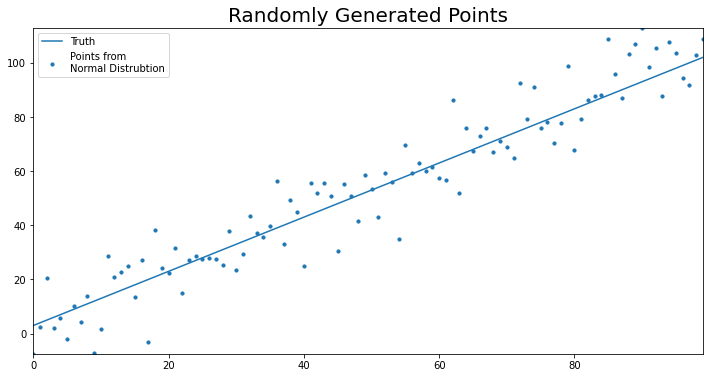

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

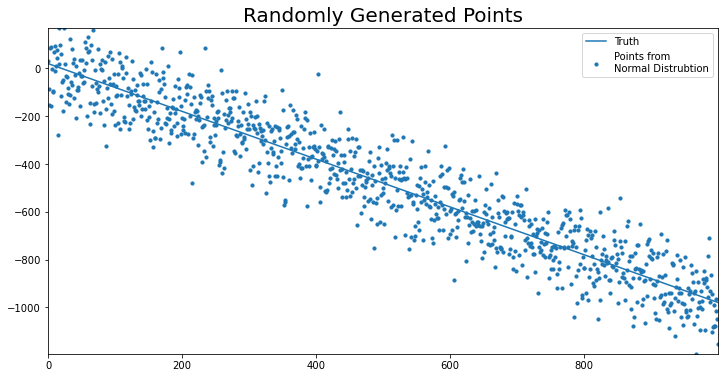

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

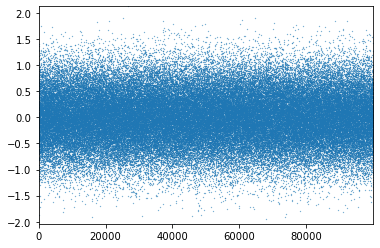

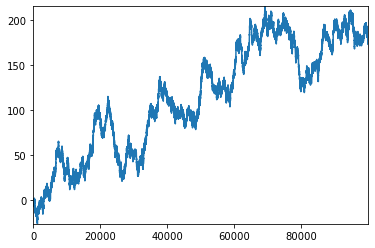

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()



In [5]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 1000
for i in range(num_sims):
    monte_carlo_sim_dict[i] = {}
    for period in range(periods):
        # create variable that references simulation i 
        # in the dictionary
        curr_sim = monte_carlo_sim_dict[i]
        if period == 0:
            curr_sim[period] = random.normalvariate(mean, sigma)
        else:
            curr_sim[period] = curr_sim[period - 1] + random.normalvariate(mean, sigma)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,1.454784,-0.936379,-0.206421,0.270481,-0.795374,0.391688,-0.386719,0.380365,0.641921,0.937806,...,-0.095426,-1.216737,-0.907296,0.950865,-1.265953,-0.276454,-0.947719,0.135510,0.088540,0.140305
1,1.759769,-2.729335,-1.027572,0.287530,-1.262228,-0.369382,0.988109,0.871063,0.099976,0.972640,...,0.077639,-0.486180,-1.422267,0.419433,-1.672273,-0.058438,0.143078,-0.061190,-0.352773,-1.027899
2,0.053465,-4.300908,-1.253360,-0.258158,-0.419979,0.125479,0.339921,0.130534,1.180280,1.773070,...,-0.317847,1.973856,-2.055479,-0.247223,-0.313421,1.112137,0.822506,-1.067943,-0.019402,-1.167321
3,-0.186456,-4.559441,-0.705803,-1.819900,-2.109080,0.337782,1.504065,0.050587,1.567056,1.222273,...,-1.110267,1.497092,-1.651889,-0.501535,-0.328240,2.621533,1.976749,-0.933237,-0.501945,-1.452538
4,0.684656,-5.546008,-0.111721,-2.779382,-2.713928,-0.911204,-0.252146,-0.009719,0.608147,-0.183348,...,-0.852975,1.173925,-1.925338,-1.736226,0.056311,1.999804,0.547447,-1.574848,-3.092542,-3.722127
5,0.931868,-5.193635,0.845550,-4.039476,-2.448148,-1.827340,-0.470186,-0.629728,0.904998,0.227733,...,1.225679,0.779918,-3.039256,-3.304725,1.028164,2.357482,0.545455,-2.665377,-2.462447,-4.620711
6,0.081131,-5.281955,2.193263,-2.363039,-3.065331,-1.543041,0.081784,-1.644047,1.015003,-0.724949,...,1.756075,1.409616,-4.143479,-3.629446,1.579000,4.541162,0.727424,-2.805367,-2.241363,-5.471601
7,-0.274975,-4.625725,2.821585,-2.684450,-2.060067,-0.871024,-0.692109,0.583028,0.296675,-1.045780,...,1.533141,0.823760,-5.453067,-3.081892,1.429826,5.406389,0.658127,-4.120926,-2.786050,-6.193224
8,1.070930,-5.063061,2.517408,-3.285678,-0.679374,-1.092101,-0.545926,1.419486,0.815038,-0.974171,...,0.172116,1.004922,-4.451574,-5.148724,1.662577,5.817000,1.281619,-4.601544,-1.883555,-5.337480
9,0.693476,-4.362022,3.536730,-2.726543,-0.858436,-0.171191,-1.740286,1.507124,1.680053,-0.487944,...,0.712852,0.276310,-6.482015,-5.424700,2.221234,4.781537,1.250186,-2.917648,-0.341503,-4.965869


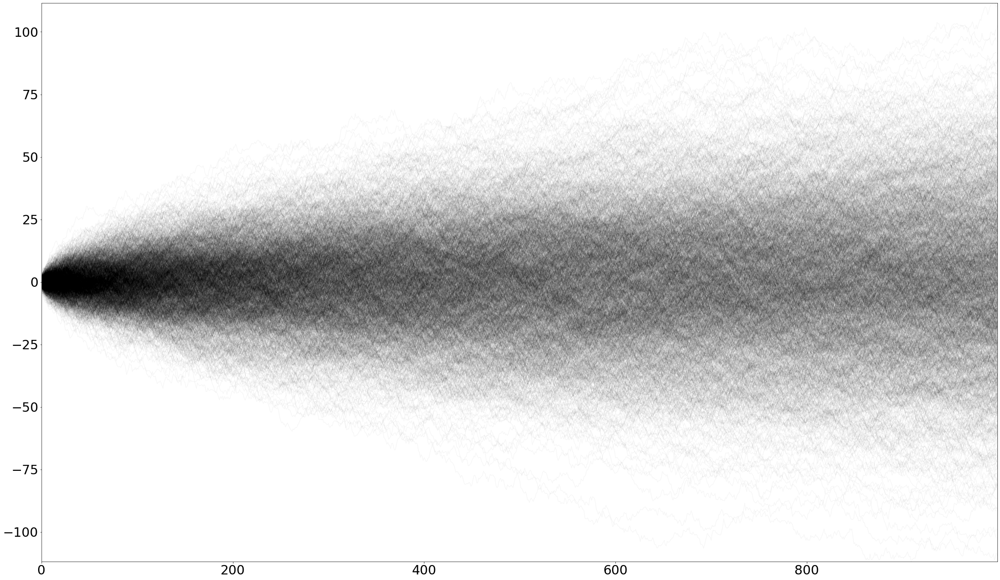

In [6]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, marker=".", markersize = .1, 
                            color ="k", alpha = .035, ax = ax)

plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  import sys


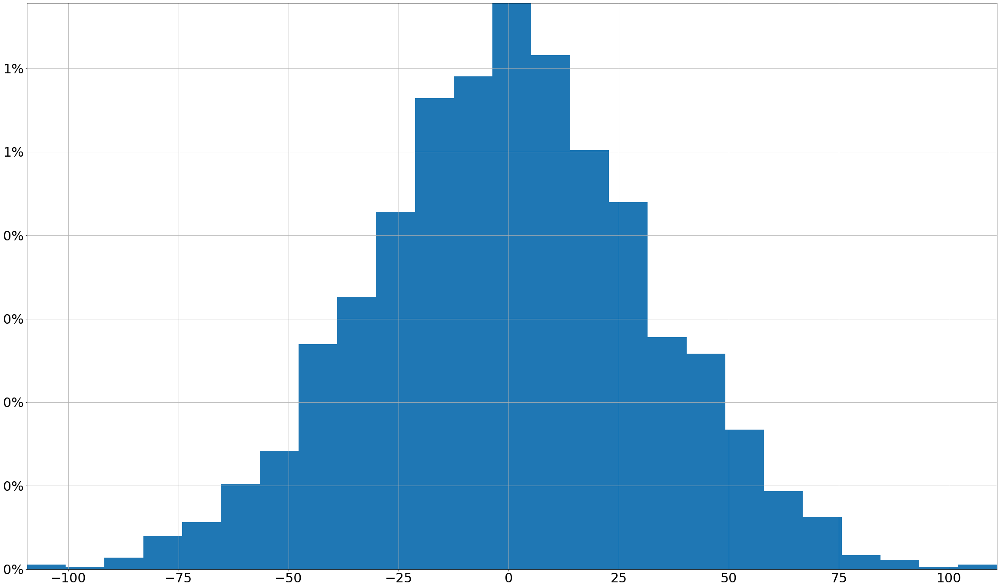

In [7]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [8]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 1000
for i in range(num_sims):
    monte_carlo_sim_dict[i] = {}
    for period in range(periods):
        # create variable that references simulation i 
        # in the dictionary
        curr_sim = monte_carlo_sim_dict[i]
        if period == 0:
            curr_sim[period] = random.normalvariate(mean, sigma)
        else:
            curr_sim[period] = curr_sim[period - 1] + random.normalvariate(mean, sigma)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.002778,0.331585,-0.286233,0.145996,-0.429076,0.009026,0.068440,-0.137077,0.132728,0.095241,...,0.111308,-0.041302,-0.169402,0.188926,0.550791,0.602537,0.755042,-0.029754,-0.085669,0.314911
1,0.824783,0.847816,-0.718024,0.369632,0.262773,0.312809,0.173171,0.202616,0.023904,0.039022,...,0.550114,-0.877755,-0.854640,0.657859,0.441048,0.333556,1.268750,0.429308,-0.048080,0.553158
2,1.888898,0.298872,-1.182086,-0.167530,0.788674,0.189731,-0.174412,0.168994,-0.209704,-0.105728,...,0.571671,-1.274856,-0.558555,0.345775,0.137324,0.396876,1.339652,0.832994,0.392675,-0.075484
3,1.469147,0.199343,-1.766924,0.199346,0.559424,1.185582,-0.379437,-0.606809,0.573097,0.525852,...,0.474924,-1.525170,-0.936734,0.337037,-0.101261,-0.082752,1.309384,1.096905,0.435535,0.890258
4,2.737348,0.446669,-2.043367,0.473793,1.310920,1.156253,-0.236397,-0.926544,0.284260,0.557608,...,1.830089,-0.416032,-0.371667,0.778525,0.642697,-0.166271,1.304881,1.407811,0.230827,0.780076
5,3.194550,0.437381,-1.853125,0.451936,0.814496,1.455984,0.466316,-0.470337,-0.887205,0.961948,...,1.794124,-0.583777,-0.007391,1.610788,0.567650,-0.445598,1.980030,0.771978,-0.282739,0.305024
6,3.212153,0.849585,-2.796700,0.834948,0.494142,1.166932,0.694002,-0.744563,-1.322739,1.472177,...,1.399228,-1.000951,0.204203,2.007585,0.356294,-0.328368,2.336744,0.294586,-0.376453,-0.536177
7,3.265332,0.623424,-3.053424,0.857451,0.753210,0.563562,0.891663,-0.383749,-1.168787,1.485570,...,1.411209,-0.751665,-0.294886,0.988702,-0.165381,-0.530497,2.322361,0.126967,0.190087,0.103396
8,3.970663,0.547314,-3.905249,1.071798,1.166747,0.481289,1.283769,-0.624453,-1.055634,1.831785,...,1.635399,-1.467155,-0.587563,1.352556,0.521164,0.110912,2.616195,0.113976,0.377409,0.613952
9,3.545714,1.516602,-3.047232,2.000167,0.633100,0.078527,1.189883,-1.857034,-0.156316,1.380564,...,2.213708,-0.236423,-0.232334,1.760363,0.059310,-0.193526,2.816711,0.953416,0.630776,1.347534


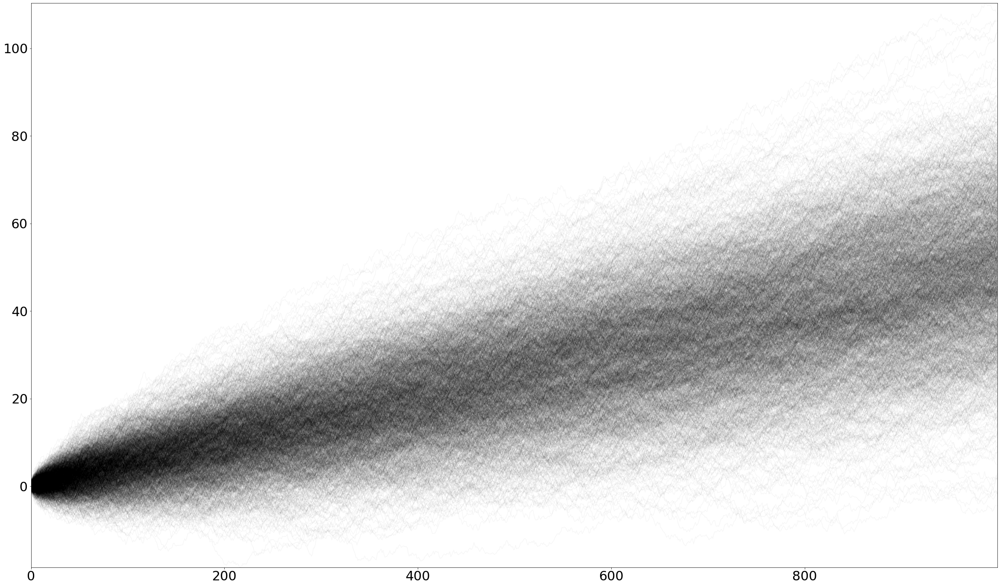

In [9]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, marker=".", markersize = .1, 
                            color ="k", alpha = .035, ax = ax)

plt.show()

### Calculating Expected Value

In [10]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0       0.059561
1       0.091622
2       0.152043
3       0.218022
4       0.281256
5       0.335773
6       0.384081
7       0.431113
8       0.472604
9       0.503544
10      0.555575
11      0.600908
12      0.644150
13      0.681424
14      0.747157
15      0.806488
16      0.842304
17      0.893938
18      0.915577
19      0.976252
20      1.039543
21      1.082956
22      1.127843
23      1.164775
24      1.231824
25      1.294853
26      1.335828
27      1.388521
28      1.449020
29      1.508379
         ...    
970    48.407254
971    48.469946
972    48.538001
973    48.599453
974    48.634099
975    48.706019
976    48.775047
977    48.814116
978    48.863330
979    48.891126
980    48.955886
981    49.017021
982    49.061437
983    49.101638
984    49.145543
985    49.201520
986    49.252898
987    49.300996
988    49.351865
989    49.402134
990    49.445671
991    49.494207
992    49.562672
993    49.622442
994    49.670292
995    49.712977
996    49.771058
997    49.8039

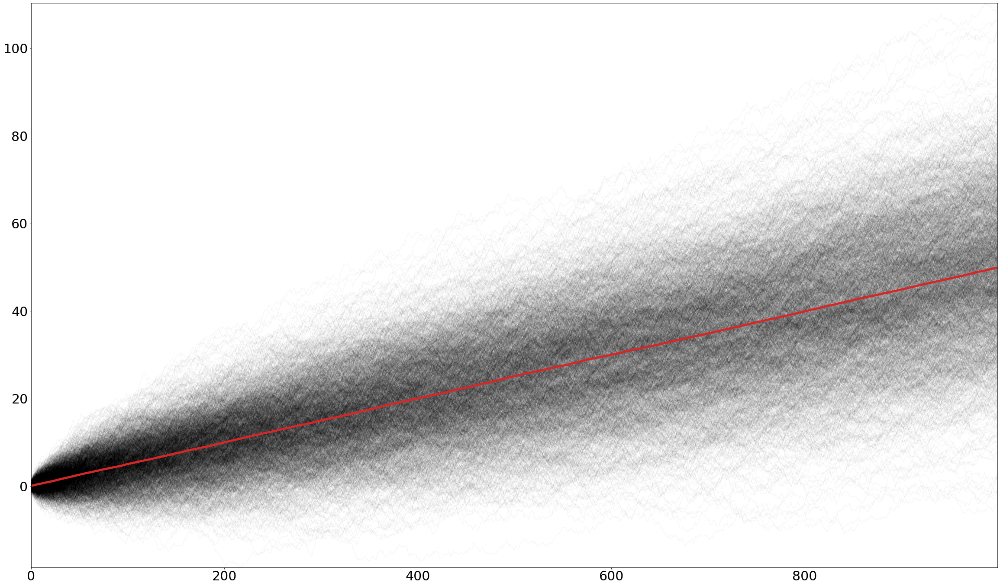

In [11]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.drop("mean", inplace = False, axis = 1).plot.line(legend = False, marker=".", markersize = .1, 
                            color ="k", alpha = .035, ax = ax)
monte_carlo_sim_df["mean"].plot.line(legend = False, color ="C3", linewidth = 5, ax = ax)
plt.show()

### Simulating Changes in Portfolio Values

In [12]:
import pandas_datareader.data as web
import datetime

# date is format (yyyy, mm, dd)
start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = ["MSFT", "AAPL", "IBM", "GOOG"]
for name in stocks:
    # web.DataReader(stockname, source, start_date, end_date)
    data_dict[name] = web.DataReader(name, "yahoo", start, end)
    
    
# make a list of the close data for each stock
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)

In [13]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072812,-0.004366,0.028109
2005-01-10,0.004874,-0.004188,-0.001044,0.006242
2005-01-11,-0.002612,-0.063805,-0.007107,-0.007792
2005-01-12,0.001871,0.013941,0.002211,0.009507
2005-01-13,-0.019044,0.066300,-0.007982,-0.000256


<AxesSubplot:xlabel='Date'>

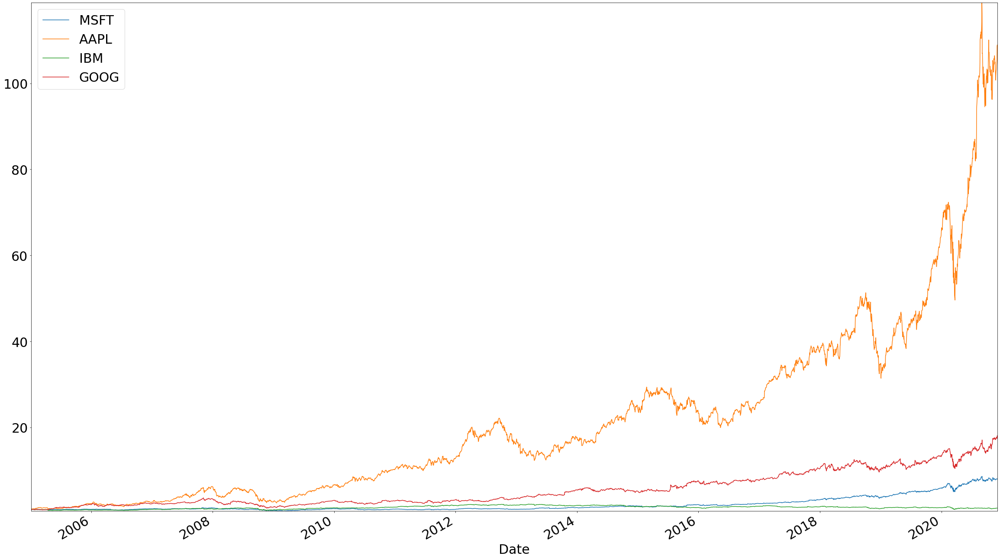

In [14]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace = True)
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(ax=ax)


### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [15]:
from pypfopt import risk_models, expected_returns
mean_var_df = pd.DataFrame({"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (1 / close_data_normalized["MSFT"].count()) - 1,
                            "sigma":close_data_pct_change.std()})

mean_var_df

,mean,sigma
MSFT,0.000521,0.017294
AAPL,0.001171,0.021049
IBM,0.000061,0.014577
GOOG,0.000723,0.018832


In [16]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock] 
    for i in range(num_sims):
        monte_carlo_sim_dict[stock][i] = {}
        curr_sim = monte_carlo_sim_dict[stock][i]

        for date in dates:
            # create variable that references simulation i 
            # in the dictionary
            curr_sim[date] = random.normalvariate(mean, sigma)
            
    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()
monte_carlo_sim_dict

{'MSFT':                  0         1          2          3         4          5    \
 2005-01-03  0.983113  0.989300   0.982511   0.998142  1.015754   1.013298   
 2005-01-04  1.006646  0.972526   0.984266   0.991291  1.023664   1.038369   
 2005-01-05  1.014067  0.958253   0.992968   0.992013  0.984891   1.046407   
 2005-01-06  1.020699  0.981306   0.974887   0.986620  0.961273   1.036223   
 2005-01-07  1.027790  0.961765   0.964636   0.983204  0.941195   1.075385   
 2005-01-10  1.043865  0.994191   0.973969   0.977180  0.973790   1.088440   
 2005-01-11  1.017052  1.014283   0.977011   1.002914  0.995228   1.123029   
 2005-01-12  1.028883  0.991528   0.986738   1.020694  1.007065   1.148532   
 2005-01-13  1.024836  0.982900   0.981278   1.017956  1.016950   1.146117   
 2005-01-14  1.015874  0.993023   0.974450   1.026508  0.996845   1.131800   
 2005-01-18  1.023246  1.005860   0.961184   1.010581  1.023301   1.135563   
 2005-01-19  0.998917  0.979084   0.957838   1.015016  1

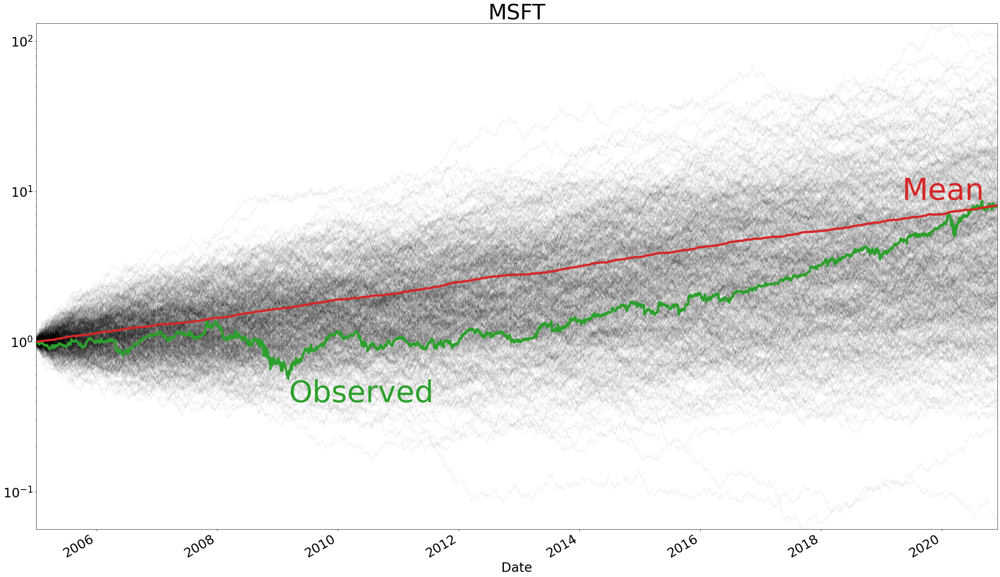

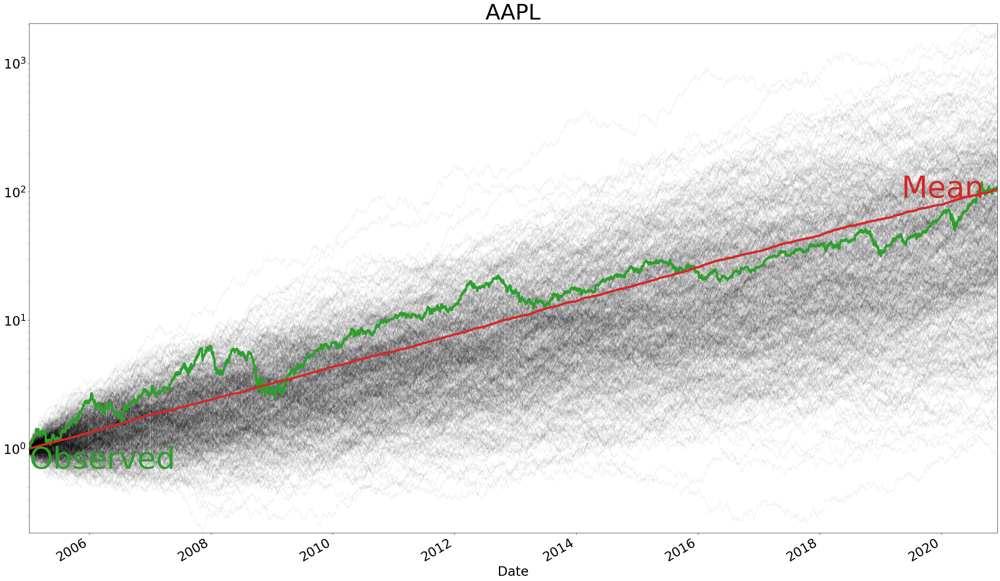

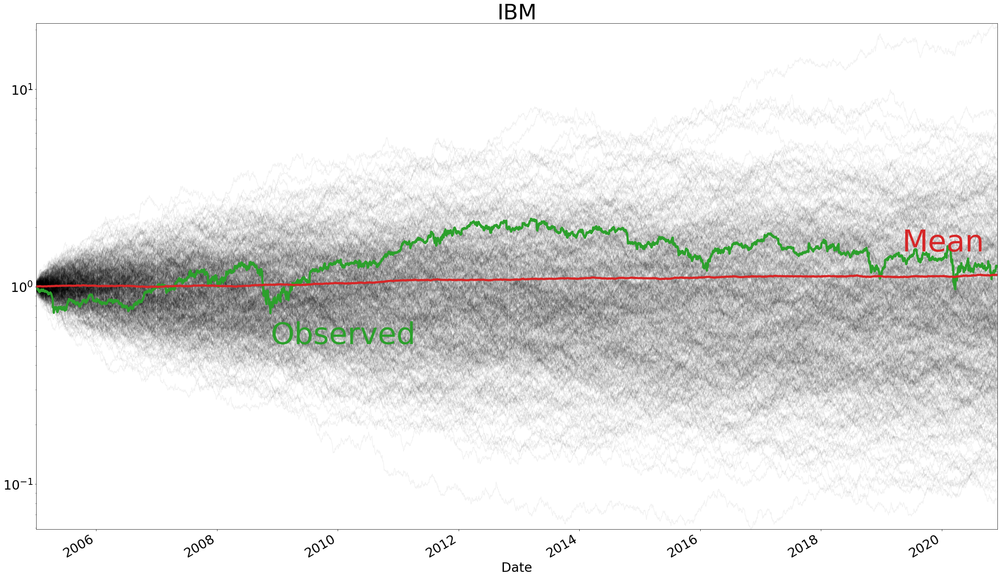

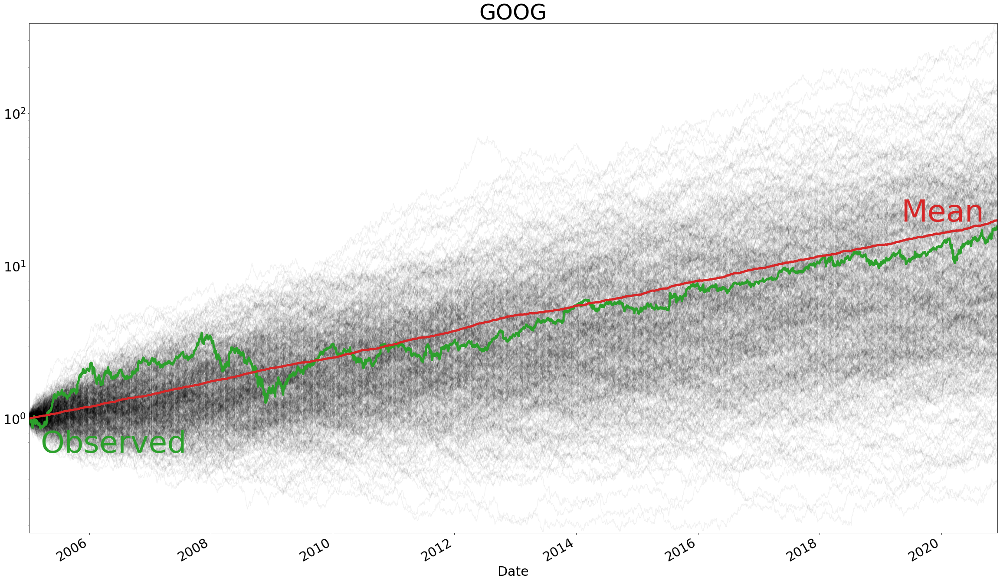

In [17]:
for stock in stocks:
    monte_carlo_sim_dict[stock]["mean"] = monte_carlo_sim_dict[stock].mean(axis=1)
    fig, ax = plt.subplots(figsize = (40, 24))
    monte_carlo_sim_dict[stock].drop("mean", inplace = False, axis = 1).plot.line(legend = False, marker=".", markersize = .1, 
                                color ="k", alpha = .05, logy = True, ax = ax)
    close_data_normalized[stock].plot.line(legend = False, color ="C2", linewidth = 5, logy = True, ax = ax, label = "Observed")
    monte_carlo_sim_dict[stock]["mean"].plot.line(legend = False, color ="C3", linewidth = 5, logy = True, ax = ax)
    
    # find lowest
    obs_text_x = close_data_normalized[close_data_normalized[stock] == close_data_normalized[stock].min()].index
    plt.text(obs_text_x, close_data_normalized[stock].loc[obs_text_x] * .7 , 
         "Observed", fontsize = 70, color = "C2")
    plt.text(dates[-400], monte_carlo_sim_dict[stock]["mean"].iloc[-400] * 1.35 , 
         "Mean", fontsize = 70, color = "C3")
    
    plt.title(stock, fontsize = 50)
    plt.show()
    plt.close()

## Calculate Portfolio Return

In [18]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [19]:
ex_return  = pd.DataFrame(close_data_normalized.apply(lambda x: x.mul(portfolio_weights[x.name]), axis = 0).sum(axis = 1), 
                         columns = ["Portfolio Return"])
ex_return

,Portfolio Return
Date,
2005-01-03,1.000000
2005-01-04,0.990692
2005-01-05,0.990610
2005-01-06,0.983643
2005-01-07,1.006923
2005-01-10,1.008229
2005-01-11,0.986581
2005-01-12,0.993409
2005-01-13,1.003779


In [20]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001297
2005-01-11,-0.021472
2005-01-12,0.006922
2005-01-13,0.010439
2005-01-14,0.004986


In [21]:
mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) ** (1 / ex_return["Portfolio Return"].count()) - 1,
                           "sigma":ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000881,0.016609


In [22]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]


for i in range(num_sims):
    monte_carlo_sim_dict[i] = {}
    curr_sim = monte_carlo_sim_dict[i]
    for date in dates:
        # create variable that references simulation i 
        # in the dictionary
        curr_sim[date] = random.normalvariate(mean, sigma)

monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,1.012091,1.014771,0.982969,1.022126,0.981038,0.994480,1.010777,1.008741,1.002030,1.010125,...,0.981286,0.987377,1.013032,1.047037,1.010187,0.989697,1.011521,1.002843,1.019636,1.005246
2005-01-04,1.002846,1.029539,0.998177,1.031976,0.988073,0.987097,1.006007,1.005950,1.025582,1.014241,...,0.967811,0.990064,1.025842,1.027291,1.027554,0.990818,1.001313,0.983194,0.990302,1.016087
2005-01-05,0.957539,1.024124,1.001221,1.009812,1.017993,0.996005,1.006080,1.005321,1.034402,0.997610,...,0.939521,0.995595,1.009264,0.972995,1.044264,0.971805,0.995273,0.969020,0.995193,1.025027
2005-01-06,0.943885,1.007309,0.993941,1.031620,0.998318,1.027867,1.001338,1.015583,1.063582,0.988370,...,0.924117,1.010418,0.998731,0.964008,1.038946,0.974643,1.009981,0.979783,0.997307,1.021952
2005-01-07,0.958881,1.019325,0.959154,1.036335,0.992072,1.001585,0.993443,1.045629,1.055001,0.963697,...,0.908978,1.002839,0.995062,0.940124,1.013857,0.977901,1.018195,0.963858,1.010905,1.044171
2005-01-10,0.965974,1.015209,0.956978,1.060322,1.008903,0.981520,0.986689,1.035349,1.061278,0.984054,...,0.941021,1.012071,0.975818,0.914987,1.027953,0.982435,1.029412,1.004287,1.019824,1.019959
2005-01-11,0.959513,1.009007,0.966290,1.067911,0.998045,0.984189,1.020128,1.080040,1.065222,0.990663,...,0.941484,0.989457,0.980238,0.912602,1.045870,0.983926,1.060052,0.991284,1.010910,1.029624
2005-01-12,0.938230,0.998349,0.968601,1.052707,0.995320,0.990225,1.031468,1.074179,1.056321,1.029390,...,0.935318,1.001702,0.964372,0.887159,1.033302,0.997317,1.076267,0.997433,1.045292,1.050352
2005-01-13,0.947870,0.995980,0.967598,1.053943,0.975402,1.000011,1.037402,1.061763,1.055675,1.006824,...,0.949275,1.005449,0.961767,0.893129,1.044045,0.970992,1.077128,0.981937,1.047286,1.048153
2005-01-14,0.976741,0.992584,0.956737,1.071183,0.982427,0.995624,1.031853,1.050688,1.051738,1.025511,...,0.927641,1.005544,0.943300,0.893977,1.054414,0.947065,1.085079,1.010562,1.052390,1.022565


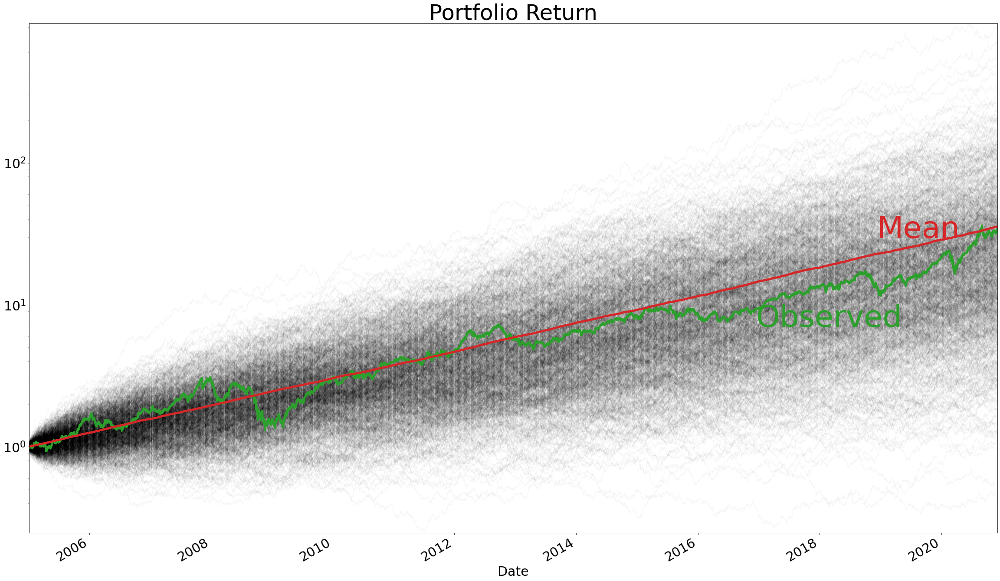

In [24]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis=1)
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.drop("mean", inplace = False, axis = 1).plot.line(
                            legend = False, marker=".", markersize = .1, 
                            color ="k", alpha = .035, logy = True, ax = ax)
ex_return.plot.line(legend = False, color ="C2", linewidth = 5, logy = True, 
                    ax = ax)
plt.text(dates[-1000], ex_return["Portfolio Return"].iloc[-1000] * .75 , 
         "Observed", fontsize = 70, color = "C2")
monte_carlo_sim_df["mean"].plot.line(legend = False, color ="C3", 
                                     linewidth = 5, 
                                     logy = True, ax = ax)
plt.text(dates[-500], monte_carlo_sim_df["mean"].iloc[-500] * 1.3, "Mean", 
          fontsize = 70, color = "C3")

plt.title("Portfolio Return", fontsize = 50)
plt.show()
plt.close()